
=== Evaluating n-step SARSA for pGen = 0.1 ===

=== n-step SARSA (pGen=0.1) Policy Training Run 1 ===

Starting SARSA run...
Initial state: [((0, 1), -1), ((1, 2), -1), ((3, 2), -1), ((2, 4), -1), ((4, 5), -1)]
Goal edges: [(3, 5), (0, 5)]

Final EDRS: {(3, 5): 1006, (0, 5): 174}
Total rewards: 38920.3970145847
Number of Q-value updates: 297
SIMULATION (Fairness-aware Q-values, stochastic success)
SIMULATION (Fairness-aware Q-values, stochastic success)
SIMULATION (Fairness-aware Q-values, stochastic success)
SIMULATION (Fairness-aware Q-values, stochastic success)
SIMULATION (Fairness-aware Q-values, stochastic success)

=== n-step SARSA (pGen=0.1) Policy Training Run 2 ===

Starting SARSA run...
Initial state: [((0, 1), -1), ((1, 2), -1), ((3, 2), -1), ((2, 4), -1), ((4, 5), -1)]
Goal edges: [(3, 5), (0, 5)]

Final EDRS: {(3, 5): 994, (0, 5): 166}
Total rewards: 39265.164356292975
Number of Q-value updates: 294
SIMULATION (Fairness-aware Q-values, stochastic success)
SIMULATION (Fai

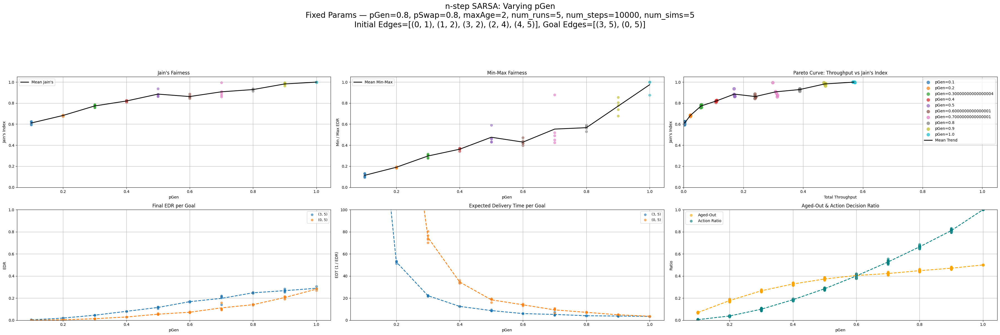


=== Evaluating n-step SARSA for pSwap = 0.1 ===

=== n-step SARSA (pSwap=0.1) Policy Training Run 1 ===

Starting SARSA run...
Initial state: [((0, 1), -1), ((1, 2), -1), ((3, 2), -1), ((2, 4), -1), ((4, 5), -1)]
Goal edges: [(3, 5), (0, 5)]

Final EDRS: {(3, 5): 112168, (0, 5): 20342}
Total rewards: 511.5017899620652
Number of Q-value updates: 671
SIMULATION (Fairness-aware Q-values, stochastic success)
SIMULATION (Fairness-aware Q-values, stochastic success)
SIMULATION (Fairness-aware Q-values, stochastic success)
SIMULATION (Fairness-aware Q-values, stochastic success)
SIMULATION (Fairness-aware Q-values, stochastic success)

=== n-step SARSA (pSwap=0.1) Policy Training Run 2 ===

Starting SARSA run...
Initial state: [((0, 1), -1), ((1, 2), -1), ((3, 2), -1), ((2, 4), -1), ((4, 5), -1)]
Goal edges: [(3, 5), (0, 5)]

Final EDRS: {(3, 5): 112392, (0, 5): 20310}
Total rewards: 512.7370612667952
Number of Q-value updates: 673
SIMULATION (Fairness-aware Q-values, stochastic success)
SIM

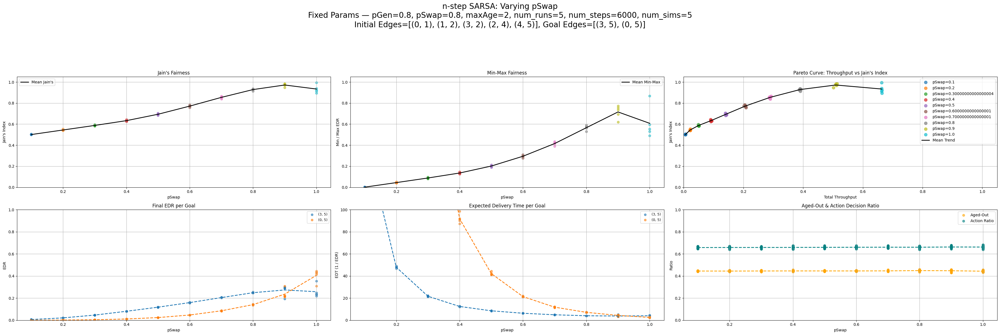

{0.1: {'edrs': {(3, 5): [np.float64(0.0058553509500242195),
    np.float64(0.005864824873290497),
    np.float64(0.005912493042130871),
    np.float64(0.005983802176836759),
    np.float64(0.006280388300784349)],
   (0, 5): [np.float64(0.0),
    np.float64(0.0),
    np.float64(0.0),
    np.float64(0.0),
    np.float64(3.645431400626516e-05)]},
  'edts': {(3, 5): [np.float64(170.78366449738058),
    np.float64(170.50778438011585),
    np.float64(169.13310536574357),
    np.float64(167.11754487732486),
    np.float64(159.2255701163271)],
   (0, 5): [np.float64(100000000.0),
    np.float64(100000000.0),
    np.float64(100000000.0),
    np.float64(100000000.0),
    np.float64(27424.072747623435)]},
  'jains': [np.float64(0.5),
   np.float64(0.5),
   np.float64(0.5),
   np.float64(0.5),
   np.float64(0.5049216671811537)],
  'minmax': [np.float64(0.0),
   np.float64(0.0),
   np.float64(0.0),
   np.float64(0.0),
   np.float64(0.004924651211288558)],
  'maxmin': [np.float64(0.0),
   np.float64

In [1]:
import random
import matplotlib.pyplot as plt
import numpy as np
from utility import *

def getEpsilonGreedyAction(state, Q, epsilon, goalEdges):
    possible_actions = getPossibleActions(state, goalEdges)
    if not possible_actions:  # If no actions available
        return ([], None)  # Return empty action tuple
    if random.random() < epsilon:
        return random.choice(possible_actions)  # Fixed: use possible_actions instead of actions
    else:
        # Get the action with highest Q-value
        return max(possible_actions, key=lambda a: Q.get_q_value(state, a))


# def getReward(action, goal_success_counts, total_timesteps, pSwap):
#     consumed_edges, goal = action
#     if goal is None or len(consumed_edges) == 0:
#         return 0
    
#     # Calculate instant rate based on path length
#     start, end = goal
#     num_edges = abs(end - start)
#     instant_rate = pSwap ** (num_edges - 1)
    
#     # Calculate EDR with small constant to avoid division by zero
#     errorTerm = 0.001
#     edr = goal_success_counts[goal] / max(1, total_timesteps) + errorTerm
    
#     # Return reward based on instant rate and EDR
#     if instant_rate > 0 and edr > 0:
#         return instant_rate / edr
#     return 0

def getReward(
    achieved_goals, 
    goal_success_counts, 
    total_timesteps, 
    p_swap, 
    punish_failed=True,
    epsilon=1e-3,
):
    reward = 0.0

    if achieved_goals is None:
        return -0.1  # Slight negative reward for doing nothing

    for goal_edge, success in achieved_goals:
        hops = max(1, abs(goal_edge[1] - goal_edge[0]))
        success_prob = p_swap ** hops
        edr = goal_success_counts[goal_edge] / max(1, total_timesteps) + epsilon

        expected_reward = (success_prob / edr)

        if success:
            reward += expected_reward
            goal_success_counts[goal_edge] += 1
        else:
            if punish_failed:
                # Explicit penalty for failure
                penalty = -expected_reward * 0.75  # Punish failures
                reward += penalty

    return reward


def plot_learning_metrics(states, actions, rewards, Q, edr_history, total_steps, q_value_diffs):
    # Create figure with 4 subplots
    fig, axs = plt.subplots(2, 2, figsize=(15, 10))
    
    # 1. Plot EDR over time
    for goal in edr_history:
        axs[0, 0].plot(range(total_steps), edr_history[goal], label=f'Goal {goal}')
    axs[0, 0].set_title('Entanglement Distribution Rate (EDR)')
    axs[0, 0].set_xlabel('Steps')
    axs[0, 0].set_ylabel('EDR (successes/step)')
    axs[0, 0].legend()
    axs[0, 0].grid(True)
    
    # Remove Q-value Changes plot
    # 2. Plot reward history
    axs[0, 1].plot(range(len(rewards)), rewards)
    axs[0, 1].set_title('Reward History')
    axs[0, 1].set_xlabel('Steps')
    axs[0, 1].set_ylabel('Reward')
    axs[0, 1].grid(True)
    
    # 3. Plot action selection distribution
    action_counts = {}
    for action_list in actions:
        if action_list:
            action = action_list[0]
            key = str(action)  # Convert to string for counting
            action_counts[key] = action_counts.get(key, 0) + 1
    
    axs[1, 0].bar(action_counts.keys(), action_counts.values())
    axs[1, 0].set_title('Action Selection Distribution')
    axs[1, 0].set_xlabel('Actions')
    axs[1, 0].set_ylabel('Count')
    axs[1, 0].tick_params(axis='x', rotation=45)
    axs[1, 0].grid(True)
    
    # 4. Plot Q-table convergence
    axs[1, 1].plot(range(len(q_value_diffs)), q_value_diffs)
    axs[1, 1].set_title('Q-table Convergence')
    axs[1, 1].set_xlabel('Steps')
    axs[1, 1].set_ylabel('Q-value Difference')
    axs[1, 1].grid(True)
    
    plt.tight_layout()
    plt.show()


def run_n_step_sarsa(initialEdges, goalEdges, totalSteps, nLookahead, epsilon, gamma, alpha, pGen, pSwap, maxAge, convergence_epsilon=0.001, plot=True):
    Q = qTable()
    total_timesteps = 0
    EDRS = {goal: 0 for goal in goalEdges}
    edr_history = {goal: [] for goal in goalEdges}  # Track EDR at each step
    q_value_diffs = []  # Track Q-value differences for convergence
    
    # Convert initialEdges to proper state format (edge, age)
    initial_state = [(edge, -1) for edge in initialEdges]  # Start with no entanglements
    states = [initial_state]
    actions = [([], None)]  # Always include do nothing action first, as the initial state is always empty too
    rewards = []
    
    current_state = initial_state
    
    print("\nStarting SARSA run...")
    print("Initial state:", current_state)
    print("Goal edges:", goalEdges)
    
    for t in range(totalSteps):
        
        # Take action A_t, observe R_{t+1} and S_{t+1}
        action = actions[-1]
        # Take the action
        current_state = performAction(action, current_state)
        current_state = ageEntanglements(current_state, maxAge)
        current_state = generateEntanglement(current_state, pGen)
        
        # # Observe the reward (and update EDRS)
        # reward = getReward(action, EDRS, t+1, pSwap)  # Pass EDRS and current timestep
        # rewards.append(reward)
        # # Update rate parameters before the action is taken 
        # total_timesteps += 1
        # Determine if goal was achieved
        achieved_goals = []  # list of (goal_edge, success_bool)

        if action and action[1] is not None:
            goal = action[1]
            # You might want a condition here depending on how "success" is determined
            success = True  # Simplified for now; depends on your sim logic
            achieved_goals.append((goal, success))

        reward = getReward(
            achieved_goals,
            EDRS,
            total_timesteps + 1,
            p_swap=pSwap
        )
        rewards.append(reward)

        total_timesteps += 1

        
        
        _, goal = action
        if goal is not None:
            EDRS[goal] += 1
        
        # Update EDR history
        for g in goalEdges:
            edr_history[g].append(EDRS[g] / (t + 1))
        
        states.append(current_state)
        
        # Select A_{t+1} using epsilon-greedy policy
        action = getEpsilonGreedyAction(current_state, Q, epsilon, goalEdges)
        actions.append(action)
        
        # 1-step SARSA update
        if t > 0:  # We need at least one previous state to update
            # Get current state, action, and reward
            s = states[t-1]
            a = action
            r = rewards[t-1]
            
            # Get next state and action
            s_prime = current_state
            a_prime = action
            
            # Get current Q-value and next Q-value
            current_q = Q.get_q_value(s, a)
            next_q = Q.get_q_value(s_prime, a_prime)
            
            # Apply 1-step SARSA update
            new_q = current_q + alpha * (r + gamma * next_q - current_q)
            Q.set_q_value(s, a, new_q)
            
            # Calculate Q-value difference for convergence tracking
            q_value_diff = abs(new_q - current_q)
            q_value_diffs.append(q_value_diff)
            # print(f"Q-value update: {current_q} -> {new_q}, Difference: {q_value_diff}")
            
            # # Check for convergence
            # if q_value_diff < convergence_epsilon:
            #     print(f"[Converged] Step {t} with Q-value difference {q_value_diff:.6f}")
            #     break
    
    print("\nFinal EDRS:", EDRS)
    print("Total rewards:", sum(rewards))
    print("Number of Q-value updates:", len(Q.q_values))
    
    # Plot learning metrics including Q-table convergence
    if plot:
        plot_learning_metrics(states, actions, rewards, Q, edr_history, totalSteps, q_value_diffs)
    
    return current_state, Q, EDRS

def train_n_step_policy(edges, goal_edges, p_swap, p_gen, max_age, seed=None, **kwargs):
    if seed is not None:
        random.seed(seed)
        np.random.seed(seed)

    # You can pass kwargs like nLookahead, alpha, epsilon, etc.
    _, Q, _ = run_n_step_sarsa(
        initialEdges=edges,
        goalEdges=goal_edges,
        totalSteps=kwargs.get("totalSteps", 100000),
        nLookahead=kwargs.get("nLookahead", 5),
        epsilon=kwargs.get("epsilon", 0.1),
        gamma=kwargs.get("gamma", 0.99),
        alpha=kwargs.get("alpha", 0.2),
        pGen=p_gen,
        pSwap=p_swap,
        maxAge=max_age,
        plot=False
    )

    return Q
# === CONFIGURATION ===

edges = [(0,1),(1,2), (3, 2), (2, 4), (4,5)]
goalEdges = [(3, 5), (0, 5)]
pSwap = 0.8
pGen = 0.8
maxAge = 2

totalSteps = 100000
nLookahead = 8
epsilon = 0.1
gamma = 0.99
alpha = 0.2

#############
param_name = "pGen"
param_values = [0.1* i for i in range(1,11)]
compare_policies_across_param(
    policy_name="n-step SARSA",
    policy_train_fn=train_n_step_policy,
    param_name=param_name,
    param_values=param_values,
    edges=edges,
    goal_edges=goalEdges,
    p_gen=pGen,        
    p_swap=pSwap,
    max_age=maxAge,
    train_kwargs={
        "totalSteps": 100000,
        "nLookahead": nLookahead,
        "alpha": 0.3,
        "epsilon": 0.1,
        "gamma": 0.99
    },
    num_runs=5,
    num_steps=10000,
    num_simulations=5,
    plot=True
)


param_name = "pSwap"
compare_policies_across_param(
    policy_name="n-step SARSA",
    policy_train_fn=train_n_step_policy,
    param_name=param_name,
    param_values=param_values,
    edges=edges,
    goal_edges=goalEdges,
    p_gen=pGen,            # Default value
    p_swap=pSwap,
    max_age=maxAge,
    train_kwargs={
        "totalSteps": 100000,
        "nLookahead": nLookahead,
        "alpha": 0.3,
        "epsilon": 0.1,
        "gamma": 0.99
    },
    num_runs=5,
    num_steps=6000,
    num_simulations=5,
    plot=True
)